In [49]:
from skimage.filters import threshold_otsu, gaussian
from skimage.restoration import denoise_wavelet
from PIL import Image, ImageStat
import matplotlib.pyplot as plt
import cv2
import numpy as np
from scipy import ndimage
import os
from skimage.segmentation import morphological_chan_vese, checkerboard_level_set
from skimage import measure
from skimage.color import label2rgb
from carbon_detection.carbon_model import get_preds as carbon_predict
from oil_detection.oil_model import get_preds as oil_predict

In [3]:
def carbon_simplify(img):
    simplified = np.array([[np.clip((((pxl*3)//30)+1)*30,0,255)  if pxl != 0 else 0 
                            for pxl in row] for row in img])
    return simplified

In [4]:
def oil_simplify(img):
    simplified = np.array([[(pxl//30)*30 for pxl in row] for row in img])
    return simplified

In [5]:
def get_masks(img):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    pil_img = Image.fromarray(img_hsv)
    mean_hue, mean_sat, mean_val = ImageStat.Stat(pil_img).mean
    img_gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    dark = (0,0,5)
    light = (20,255,200)
    mask_orange = cv2.inRange(img_hsv, dark, light)
    img_orange = cv2.bitwise_and(img_gray, img_gray, mask=mask_orange)
    
    dark = (120,0,5)
    light = (180,255,60)
    mask_red = cv2.inRange(img_hsv, dark, light)
    img_red = cv2.bitwise_and(img_gray, img_gray, mask=mask_red)
    
    img_carbon = cv2.bitwise_or(img_orange, img_red)
    img_carbon = ndimage.median_filter(input=img_carbon, size=20, cval=0.0, mode='reflect') #1
    img_carbon = carbon_simplify(img_carbon)
    
    
    dark = (0,0,50+mean_val/3)
    light = (179,255,255)
    mask_yel = cv2.inRange(img_hsv, dark, light)
    img_yel = cv2.bitwise_and(img_gray, img_gray, mask=mask_yel)
    img_yel = ndimage.median_filter(input=img_yel, size=20, cval=0.0, mode='reflect') #2
    img_yel = oil_simplify(img_yel)
    
    return img_carbon, img_yel

In [6]:
def contour(img):
    init_ls = checkerboard_level_set(img.shape, 6)
    ls = morphological_chan_vese(img, 35, init_level_set=init_ls, smoothing=3)
    return ls

In [7]:
def crop(image):
    w, h = image.size
    i = 5
    max_reas = 0
    pos = 0
    while i <= w/4:
        area = [i, 0, i+1, h]
        leftcrop = image.crop(area)
        area = [i+1, 0, i+2, h]
        rightcrop = image.crop(area)
        lr, lg, lb = ImageStat.Stat(leftcrop).mean
        rr, rg, rb = ImageStat.Stat(rightcrop).mean
        reas = abs(rr-lr + rg-lg + rb-lb)
        if reas > 3:
            max_reas = reas
            pos = i
        i += 1

    i = w-5
    max_reas = 0
    pos2 = w
    while i >= w*3/4:
        area = [i, 0, i+1, h]
        leftcrop = image.crop(area)
        area = [i, 0, i+2, h]
        rightcrop = image.crop(area)
        lr, lg, lb = ImageStat.Stat(leftcrop).mean
        rr, rg, rb = ImageStat.Stat(rightcrop).mean
        reas = abs(rr-lr + rg-lg + rb-lb)
        if reas > 3:
            max_reas = reas
            pos2 = i
        i -= 1
    
    croparea = [pos, 0, pos2, h]
    
    return croparea

In [8]:
image = Image.open('data/Unload2/data/1001885.jpeg')
dl_img = Image.open('data/Unload2/data/1001884.jpeg')
croparea = crop(dl_img)
cropped_img = np.array(image.crop(croparea))

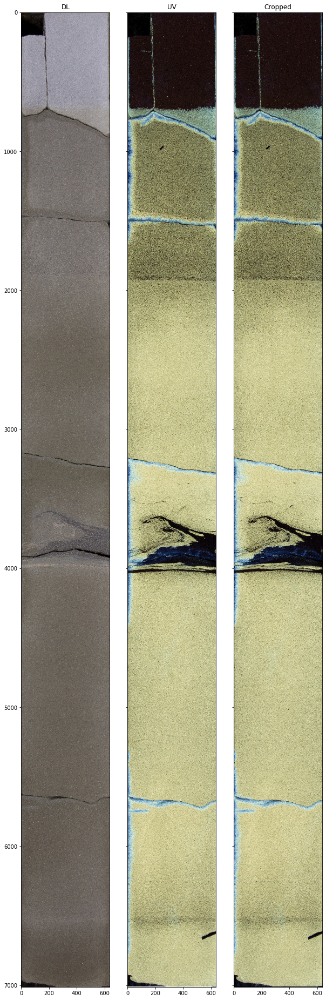

In [9]:
fig, (ax1,ax2,ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(dl_img)
ax1.set_title('DL')
ax2.imshow(image)
ax2.set_title('UV')
ax3.imshow(cropped_img)
ax3.set_title('Cropped')

plt.show()

In [10]:
carbon_mask, oil_mask = get_masks(cropped_img)

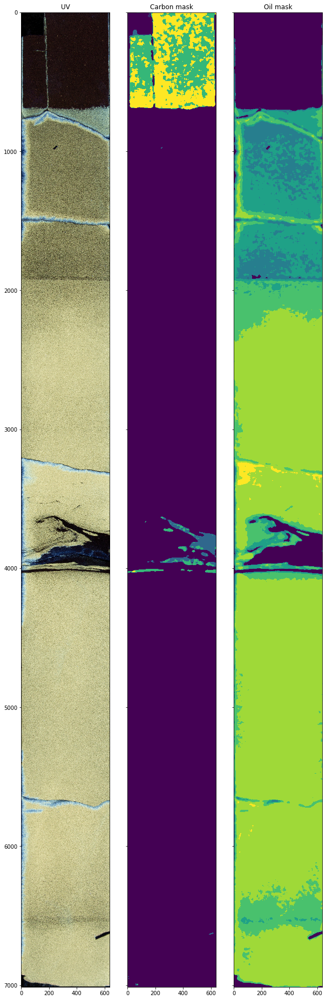

In [11]:
fig, (ax1,ax2,ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(cropped_img)
ax1.set_title('UV')
ax2.imshow(carbon_mask)
ax2.set_title('Carbon mask')
ax3.imshow(oil_mask)
ax3.set_title('Oil mask')

plt.show()

In [12]:
ls_carbon = contour(carbon_mask)
ls_yel = contour(oil_mask)

In [13]:
mask = np.array([[[carbon_mask[i][j], oil_mask[i][j], 0] 
        for j in range(len(cropped_img[0]))] for i in range(len(cropped_img))])

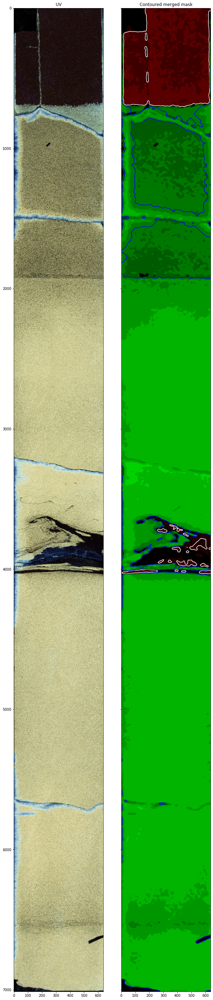

In [14]:
fig, (ax1,ax2) = plt.subplots(1, 2,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(cropped_img)
ax1.set_title('UV')
ax2.imshow(mask)
ax2.contour(ls_carbon, [0.5], colors='white')
ax2.contour(ls_yel, [0.5], colors='blue')
ax2.set_title('Contoured merged mask')

plt.show()

In [42]:
carbon_label = measure.label(carbon_mask)
carbon_overlay = label2rgb(carbon_label, image=cropped_img)
oil_label = measure.label(oil_mask)
oil_overlay = label2rgb(oil_label, image=cropped_img)

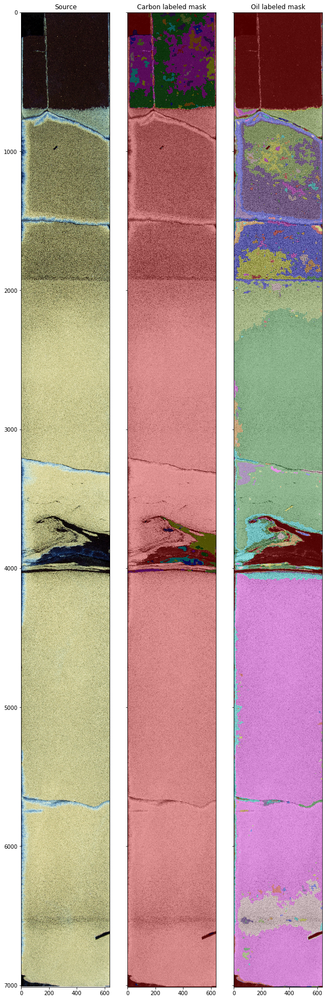

In [31]:
fig, (ax1,ax2, ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(image)
ax1.set_title('Source')
ax2.imshow(carbon_overlay)
ax2.set_title('Carbon labeled mask')
ax3.imshow(oil_overlay)
ax3.set_title('Oil labeled mask')

plt.show()

In [43]:
def merge_props(labeled, minsize):
    def dist(a, b):
        dist = ((b[0]-a[0])**2 + (b[1]-a[1])**2)**(0.5)
        return dist
    changed = [0]
    while changed != []:
        changed = []
        props = measure.regionprops(labeled)
        for prop1 in props:
            lbl1 = prop1.label
            if lbl1 not in changed:
                if prop1.area < minsize:
                    merged = False
                    centr1 = prop1.centroid
                    for prop2 in props:
                        centr2 = prop2.centroid
                        lbl2 = prop2.label
                        if lbl1 != lbl2 and lbl2 not in changed and dist(centr1, centr2) < 100:
                            merged = True
                            labeled = np.array([[lbl2 if c == lbl1 else c
                                        for c in r] for r in labeled])
                            break
                    if merged == False:
                        labeled = np.array([[0 if c == lbl1 else c
                                        for c in r] for r in labeled])
                    changed.append(lbl1)
        print(changed)
    
    return labeled

In [44]:
minsize = (len(cropped_img[0]) * 100) // 3
carbon_label = merge_props(carbon_label, minsize)
carbon_overlay = label2rgb(carbon_label, image=cropped_img)
oil_label = merge_props(oil_label, minsize)
oil_overlay = label2rgb(oil_label, image=cropped_img)

[1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 22

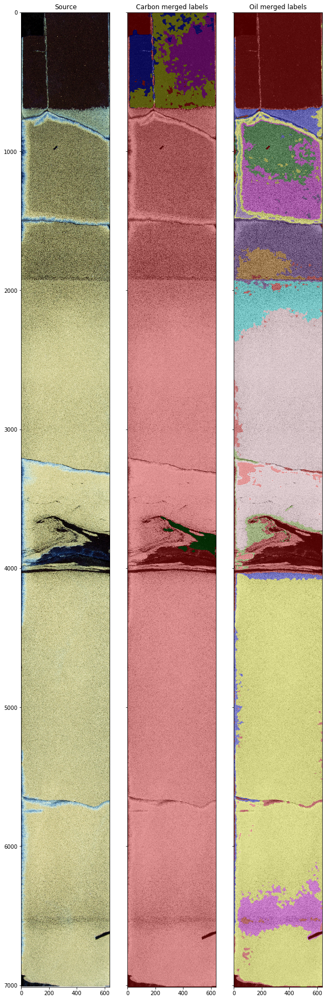

In [45]:
fig, (ax1,ax2, ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(image)
ax1.set_title('Source')
ax2.imshow(carbon_overlay)
ax2.set_title('Carbon merged labels')
ax3.imshow(oil_overlay)
ax3.set_title('Oil merged labels')

plt.show()

In [94]:
def validate_label(img, labeled, predict):
    img = Image.fromarray(img)
    props = measure.regionprops(labeled)
    crops = []
    w, h = img.size
    for prop in props:
        centr = prop.centroid
        croparea = [0, centr[0]-50 if centr[0] > 50 else 0, 
                    w, centr[0]+50 if centr[0]+50 < h else h]
        crop = img.crop(croparea)
        fig, ax = plt.subplots(figsize=(3,50))
        ax.imshow(crop)
        plt.show()
        crops.append(crop)
    preds = predict(crops)
    print(preds)
    for i in range(len(props)):
        lbl = props[i].label
        if preds[i] == 'no':
            labeled = np.array([[0 if c == lbl else c
                                    for c in r] for r in labeled])
        if preds[i] == 'low':
            labeled = np.array([[-1 if c == lbl else c
                                    for c in r] for r in labeled])
        if preds[i] == 'high':
            labeled = np.array([[-2 if c == lbl else c
                                    for c in r] for r in labeled])
    return labeled

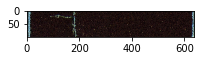

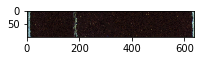

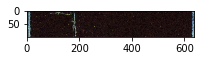

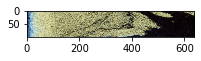

['low' 'low' 'low' 'no']


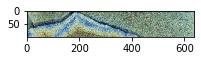

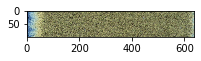

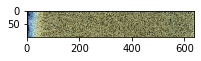

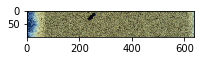

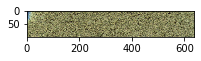

...

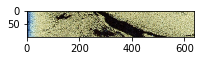

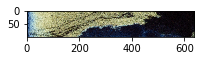

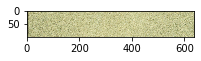

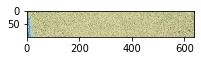

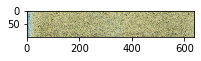

['low' 'low' 'low' 'low' 'low' 'low' 'low' 'high' 'low' 'low' 'high' 'low'
 'low']


In [91]:
carbon_label_val = validate_label(cropped_img, carbon_label, carbon_predict)
oil_label_val = validate_label(cropped_img, oil_label, oil_predict)

In [92]:
mask_val = np.array([[[carbon_label_val[i][j]*(-100), oil_label_val[i][j]*(-100), 0] 
                            for j in range(len(cropped_img[0]))] for i in range(len(cropped_img))])

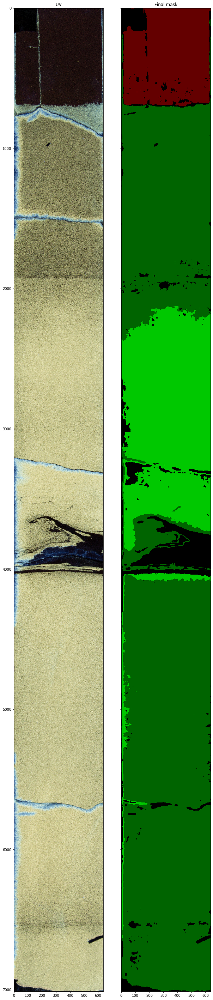

In [93]:
fig, (ax1,ax2) = plt.subplots(1, 2,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(cropped_img)
ax1.set_title('UV')
ax2.imshow(mask_val)
ax2.set_title('Final mask')

plt.show()

TODO: 
clear image before labling to get faster merging,
resolve conflicts between oil and carbon masks